# <font color=blue>Client Project</font>
## Project ID: <font color=green>PRCL-0017</font>
## Project Name: <font color='dark pink'>NO-CHURN TELECOM</font>

# <font color='Blue'>Business Case</font>
* No-Churn Telecom ia an established Telecom operator in **Europe** with more then a decade in Business.Due to new players in the market,telecom industry has become very competitive and retaining customers becoming a challenge.
* In spite of **No-Churn** initiatives of reducing tarrifs and promoting more offers,the churn rate(percentage of customers migrating to competitors)is well above 10%.
* No-churn wants to explore possibility of Machine Learning to help with the following use cases to retain competitive edge in the industry.
* 
 **The very important aspect of this entire project is to Finding who are the customers who might leave in the next Billing Period?**

# <font color='Blue'>Domain Analysis</font>

The Dataset comprises of a total of 21 columns and 4617 rows.

1. **State**: The State in the USA to which the account belongs.
2. **Account Length**: The number of days the customer has been with the dedicated brand.
3. **Area code**: The area code where the customer resides.
4. **Phone**: A Unique identifier for the customer.
5. **International plan**: Indicates wheather the customer has an international plan or not.
6. **VMail plan**: Indicates wheather the customer has voice mail plan.
7. **VMail Message**: The number of voice mail inbox messages the customer has.
8. **Day Mins**: The total number of day time minutes the customer has used.
9. **Day calls**: The number of calls the customer made during the day.
10. **Day Charge**: The total expenses incurred by the customer for daytime usage.
11. **Eve Mins**: The total number of evening minutes the customer has used.
12. **Eve Calls**: The total number of calls the customer made during the evening.
13. **Eve Charge**: The total expenses incurred by the customer for evening usage.
14. **Night Mins**: The total number of night minutes the customer has used.
15. **Night Calls**: The total number of calls the customer made during the night.
16. **Night Charge**: The total expenses incurred by the customer for nighttime usage.
17. **International Mins**: The  total number of international minutes the customer has used.
18. **International Calls**: The total number of international calls made by the customer.
19. **International Charge**: The total expenses incurred by the customer for international usage.
20. **CustServ Calls**: The number of calls made by the customer to customer service.
21. **Churn**: It indicates wheather the customer has churned(cancelled their service)or not.

## Import Basic Libraries

In [5]:
import mysql.connector
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 
import warnings 
warnings.filterwarnings('ignore')

## Loading Dataset Through SQL

In [7]:
db=mysql.connector.connect(host='18.136.157.135',
                           user='dm_team3',
                           password='DM!$!Team!27@9!20&',
                           database='project_telecom')

In [9]:
table=pd.read_sql_query('show tables',db)
print(table)

  Tables_in_project_telecom
0        telecom_churn_data


In [ ]:
table_name='telecom_churn_data'
table_details=pd.read_sql_query(f'DESCRIBE {table_name}', db)
print(table_details)

In [ ]:
query = 'select * from telecom_churn_data'
churn_data = pd.read_sql(query,db)
print(churn_data)

In [ ]:
# to see all rows and columns
pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)
churn_data

### Inference:
* The total number of rows are 4616 and columns of 21 including target column.
* The columns names wear unnamed properly,and it has been converted accordingly.

In [ ]:
# changing columns properly
churn_data.rename(columns={'columns1':'State','columns2':'Account_length','columns3':'Area_code',
                           'columns4':'Phone','columns5':'International_plan','columns6':'Vmail_plan',
                           'columns7':'Vmail_message','columns8':'Day_mins','columns9':'Day_calls',
                           'columns10':'Day_charge','columns11':'Eve_mins','columns12':'Eve_calls',
                           'columns13':'Eve_charge','columns14':'Night_mins','columns15':'Night_calls',
                           'columns16':'Night_charge','columns17':'International_mins','columns18':'International_calls',
                           'columns19':'International_charge','columns20':'custserv_calls','columns21':'Churn'},inplace=True)
churn_data

## Basic checks

In [ ]:
churn_data.columns

In [ ]:
churn_data.head()

In [ ]:
churn_data.tail()

In [27]:
churn_data.shape

(4617, 21)

In [ ]:
churn_data.dtypes

In [ ]:
churn_data.info()

In [ ]:
churn_data.describe()

## Inference
* Certain data supposed to be integer and float data type.
* Next step is to convert specified columns into their respective data type

In [36]:
object_to_integer=['Account_length','Area_code','Vmail_message','Day_calls','Eve_calls',
                   'Night_calls','International_calls','custserv_calls']
for column in object_to_integer:
    churn_data[column]=pd.to_numeric(churn_data[column],errors='coerce',downcast='integer')

In [38]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   State                 4617 non-null   object
 1   Account_length        4617 non-null   int16 
 2   Area_code             4617 non-null   int16 
 3   Phone                 4617 non-null   object
 4   International_plan    4617 non-null   object
 5   Vmail_plan            4617 non-null   object
 6   Vmail_message         4617 non-null   int8  
 7   Day_mins              4617 non-null   object
 8   Day_calls             4617 non-null   int16 
 9   Day_charge            4617 non-null   object
 10  Eve_mins              4617 non-null   object
 11  Eve_calls             4617 non-null   int16 
 12  Eve_charge            4617 non-null   object
 13  Night_mins            4617 non-null   object
 14  Night_calls           4617 non-null   int16 
 15  Night_charge          4617 non-null   

In [40]:
object_to_float=['Day_mins','Day_charge','Night_mins','Night_charge','Eve_mins',
                 'Eve_charge','International_mins','International_charge']

for column in object_to_float:
    churn_data[column]=pd.to_numeric(churn_data[column],errors='coerce')



In [42]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   object 
 1   Account_length        4617 non-null   int16  
 2   Area_code             4617 non-null   int16  
 3   Phone                 4617 non-null   object 
 4   International_plan    4617 non-null   object 
 5   Vmail_plan            4617 non-null   object 
 6   Vmail_message         4617 non-null   int8   
 7   Day_mins              4617 non-null   float64
 8   Day_calls             4617 non-null   int16  
 9   Day_charge            4617 non-null   float64
 10  Eve_mins              4617 non-null   float64
 11  Eve_calls             4617 non-null   int16  
 12  Eve_charge            4617 non-null   float64
 13  Night_mins            4617 non-null   float64
 14  Night_calls           4617 non-null   int16  
 15  Night_charge         

In [44]:
churn_data.duplicated().sum()

0

In [46]:
churn_data.describe()

,Account_length,Area_code,Vmail_message,Day_mins,Day_calls,Day_charge,Eve_mins,Eve_calls,Eve_charge,Night_mins,Night_calls,Night_charge,International_mins,International_calls,International_charge,custserv_calls
count,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000,4617.000000
mean,100.645224,437.046350,7.849903,180.447152,100.054364,30.676576,200.429088,100.179770,17.036703,200.623933,99.944120,9.028185,10.279294,4.433831,2.775926,1.567035
std,39.597194,42.288212,13.592333,53.983540,19.883027,9.177145,50.557001,19.821314,4.297332,50.543616,19.935053,2.274488,2.757361,2.457615,0.744413,1.307019
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,12.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,165.900000,87.000000,14.100000,167.100000,87.000000,7.520000,8.600000,3.000000,2.320000,1.000000
50%,100.000000,415.000000,0.000000,180.000000,100.000000,30.600000,200.800000,101.000000,17.070000,200.800000,100.000000,9.040000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,17.000000,216.800000,113.000000,36.860000,234.000000,114.000000,19.890000,234.900000,113.000000,10.570000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,351.500000,165.000000,59.760000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [48]:
churn_data.isnull().sum()

State                   0
Account_length          0
Area_code               0
Phone                   0
International_plan      0
Vmail_plan              0
Vmail_message           0
Day_mins                0
Day_calls               0
Day_charge              0
Eve_mins                0
Eve_calls               0
Eve_charge              0
Night_mins              0
Night_calls             0
Night_charge            0
International_mins      0
International_calls     0
International_charge    0
custserv_calls          0
Churn                   0
dtype: int64

In [50]:
State_Churn = churn_data.groupby('State')['Churn'].value_counts().unstack().fillna(0)
State_Churn

Churn,False.,True.
State,,
AK,64,5
AL,104,10
AR,62,15
AZ,74,7
CA,31,13
CO,81,10
CT,78,14
DC,73,9
DE,75,14


In [52]:
churn_data.State.value_counts()

State
WV    149
AL    114
MN    112
OH    110
ID    110
VA    109
NY    109
OR    107
NJ    106
WY    106
TX    105
UT    104
WI     99
MI     98
MA     97
KS     96
VT     95
ME     95
CT     92
MD     92
MT     92
MS     91
NH     91
CO     91
KY     90
RI     90
NV     89
IN     89
DE     89
WA     89
FL     85
NM     84
MO     84
SC     83
NC     83
TN     83
DC     82
AZ     81
ND     80
OK     80
HI     79
NE     79
IL     79
AR     77
GA     77
SD     76
LA     73
AK     69
PA     68
IA     65
CA     44
Name: count, dtype: int64

# Data Visualization

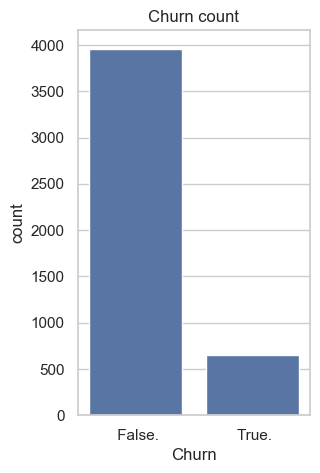

In [55]:
sns.set(style="whitegrid")
plt.figure(figsize=(3,5))
sns.countplot(data=churn_data,x="Churn")
plt.title("Churn count")
plt.show()

**False**:It indicates customer has not churned,meaning nearlly 4000 people are still using the service.

**True**:It indicates customer has churned,meaning nearlly 600 customer stopped using the serivce.
 

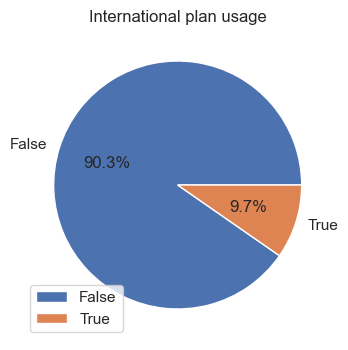

In [58]:
# International plan
y=churn_data['International_plan'].value_counts()
plt.figure(figsize=(4,5))
labels=['False','True']
plt.pie(y,labels=labels,autopct='%1.1f%%')
plt.legend(loc='lower left')
plt.title('International plan usage')
plt.show()

In [ ]:
#state churn
sns.set(style="whitegrid")
plt.figure(figsize=(18,8))
sns.countplot(data=churn_data,x="State")
plt.title("State count")
plt.show()

In [ ]:
#customer service churn
plt.figure(figsize=(4,4))
sns.countplot(x="custserv_calls", hue="Churn",data=churn_data)

In [ ]:
#churn rates by states
plt.figure(figsize=(13,5))
sns.countplot(data=churn_data, hue="Churn", x="State")
plt.title("Churn rates by states")
plt.xlabel("State")
plt.ylabel("Churn")
plt.xticks(rotation=90)
plt.show()


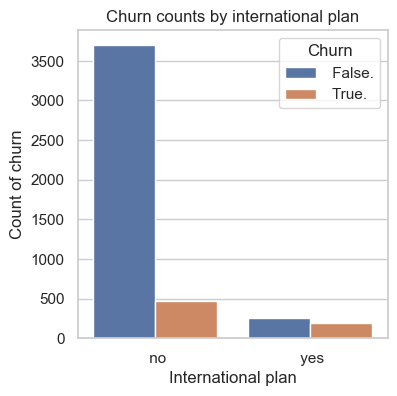

In [65]:
#churn counts by international plan
fig,ax=plt.subplots(1,1,figsize=(4,4))
sns.countplot(data=churn_data,x="International_plan",hue="Churn")
plt.xlabel("International plan")
plt.ylabel("Count of churn")
plt.title("Churn counts by international plan")
plt.show()


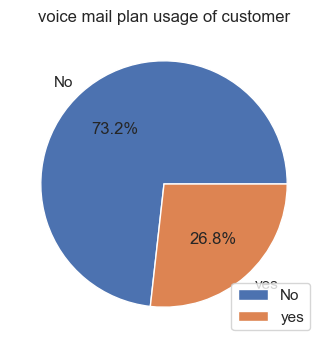

In [66]:
#voice mail plan
y=churn_data['Vmail_plan'].value_counts()
plt.figure(figsize=(4,4))
labels=['No','yes']
plt.pie(y,labels=labels,autopct='%1.1f%%')
plt.legend(loc='lower right')
plt.title('voice mail plan usage of customer')
plt.show()

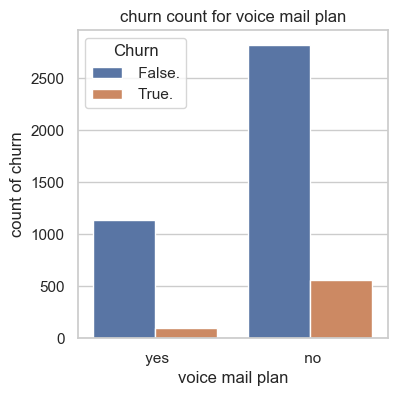

In [70]:
#churn count for voice mail plan
fig,ax=plt.subplots(1,1,figsize=(4,4))
sns.countplot(x='Vmail_plan',data=churn_data,hue='Churn')
plt.xlabel('voice mail plan')
plt.ylabel('count of churn')
plt.title('churn count for voice mail plan')
plt.show()

In [ ]:
calls_columns=['Day_calls','Eve_calls','Night_calls','International_calls']
charge_columns=['Day_charge','Eve_charge','Night_charge','International_charge']
plt.figure(figsize=(10,8))
for i in range(len(calls_columns)):
    plt.subplot(2,2,i+1)
    plt.scatter(churn_data[calls_columns[i]],churn_data[charge_columns[i]],alpha=0.5)
    plt.title(f'{calls_columns[i]} vs{charge_columns[i]}')
    plt.xlabel(calls_columns[i])
    plt.ylabel(charge_columns[i])
plt.tight_layout()    
plt.show()

In [ ]:
plt.figure(figsize=(12,8))
Mins_columns=['Day_mins','Night_mins','Eve_mins','International_mins']
charge_columns=['Day_charge','Night_charge','Eve_charge','International_charge']
for i in range(len(calls_columns)):
    plt.subplot(2,2,i+1)
    plt.hist(churn_data[Mins_columns[i]], bins=20, alpha=0.5, label='Mins', color='blue')
    plt.hist(churn_data[charge_columns[i]], bins=20 ,alpha=0.5, label='charge', color='green')
    plt.title(f'{Mins_columns[i]} vs {charge_columns[i]}')
    plt.xlabel('count')
    plt.ylabel('frequency')
    plt.legend()
plt.tight_layout()
plt.show()
    

In [74]:
cost_per_minute_day=churn_data['Day_charge']/churn_data['Day_mins']
cost_per_minute_evening=churn_data['Eve_charge']/churn_data['Eve_mins']
cost_per_minute_night=churn_data['Night_charge']/churn_data['Night_mins']
cost_per_minute_international=churn_data['International_charge']/churn_data['International_mins']

average_cost_per_day=cost_per_minute_day.mean()
average_cost_per_evening=cost_per_minute_evening.mean()
average_cost_per_night=cost_per_minute_night.mean()
average_cost_per_international=cost_per_minute_international.mean()

print(f'Average cost per minute DAY :{average_cost_per_day:.2f}')
print(f'Average cost per minute EVENING :{average_cost_per_evening:.2f}')
print(f'Average cost per minute NIGHT :{average_cost_per_night:.2f}')
print(f'Average cost per minute INTERNATIONAL :{average_cost_per_international:.2f}')


Average cost per minute DAY :0.17
Average cost per minute EVENING :0.09
Average cost per minute NIGHT :0.05
Average cost per minute INTERNATIONAL :0.27


**In the above case we can analyse from this situtation that this values cannot be clubbed together as they can play a significant role.**

In [ ]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in churn_data:
    if plotnumber<=21:
        ax=plt.subplot(6,4,plotnumber)  
        sns.histplot(churn_data[column])
        plt.xlabel(column) 
        plt.ylabel('count')
    plotnumber+=1 
plt.tight_layout()    
    

**Almost all of them are normally skewed normally also zero skewness.**

In [ ]:
sns.pairplot(churn_data,hue='Churn',diag_kind='kde')
plt.show()

**In the above case we have seen that the higher value it goes,the more orange that is TRUE.**

**It is witnessed indicating the high chance of CHURN with more usage and spending.**

## Converting Categorical to Numerical data

In [82]:
from sklearn.preprocessing import LabelEncoder
lb=LabelEncoder()

In [84]:
churn_data['Churn']=lb.fit_transform(churn_data['Churn'])
churn_data['International_plan']=lb.fit_transform(churn_data['International_plan'])
churn_data['Vmail_plan']=lb.fit_transform(churn_data['Vmail_plan'])
churn_data['State']=lb.fit_transform(churn_data['State'])

In [99]:
churn_data

,State,Account_length,Area_code,Phone,International_plan,Vmail_plan,Vmail_message,Day_mins,Day_calls,Day_charge,Eve_mins,Eve_calls,Eve_charge,Night_mins,Night_calls,Night_charge,International_mins,International_calls,International_charge,custserv_calls,Churn
0,16,128,415,382-4657,0,1,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0
1,35,107,415,371-7191,0,1,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0
2,31,137,415,358-1921,0,0,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0
3,35,84,408,375-9999,1,0,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0
4,36,75,415,330-6626,1,0,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0
5,1,118,510,391-8027,1,0,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0,0
6,19,121,510,355-9993,0,1,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,0
7,24,147,415,329-9001,1,0,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,0
8,18,117,408,335-4719,0,0,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,0
9,49,141,415,330-8173,1,1,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,0


In [86]:
State_churn=churn_data.groupby('State')['Churn'].value_counts().unstack().fillna(0)
State_churn['total_count']=State_churn[0] + State_churn[1]
State_churn=State_churn.sort_values(by='total_count',ascending=False)
State_churn

Churn,0,1,total_count
State,,,
49,128,21,149
1,104,10,114
23,94,18,112
13,97,13,110
35,95,15,110
34,91,18,109
45,103,6,109
37,90,17,107
31,81,25,106


In [88]:
churn_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4617 entries, 0 to 4616
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   State                 4617 non-null   int32  
 1   Account_length        4617 non-null   int16  
 2   Area_code             4617 non-null   int16  
 3   Phone                 4617 non-null   object 
 4   International_plan    4617 non-null   int32  
 5   Vmail_plan            4617 non-null   int32  
 6   Vmail_message         4617 non-null   int8   
 7   Day_mins              4617 non-null   float64
 8   Day_calls             4617 non-null   int16  
 9   Day_charge            4617 non-null   float64
 10  Eve_mins              4617 non-null   float64
 11  Eve_calls             4617 non-null   int16  
 12  Eve_charge            4617 non-null   float64
 13  Night_mins            4617 non-null   float64
 14  Night_calls           4617 non-null   int16  
 15  Night_charge         

In [90]:
churn_data.Account_length.unique()

array([128, 107, 137,  84,  75, 118, 121, 147, 117, 141,  65,  74, 168,
        95,  62, 161,  85,  93,  76,  73,  77, 130, 111, 132, 174,  57,
        54,  20,  49, 142, 172,  12,  72,  36,  78, 136, 149,  98, 135,
        34, 160,  64,  59, 119,  97,  52,  60,  10,  96,  87,  81,  68,
       125, 116,  38,  40,  43, 113, 126, 150, 138, 162,  90,  50,  82,
       144,  46,  70,  55, 106,  94, 155,  80, 104,  99, 120, 108, 122,
       157, 103,  63, 112,  41, 193,  61,  92, 131, 163,  91, 127, 110,
       140,  83, 145,  56, 151, 139,   6, 115, 146, 185, 148,  32,  25,
       179,  67,  19, 170, 164,  51, 208,  53, 105,  66,  86,  35,  88,
       123,  45, 100, 215,  22,  33, 114,  24, 101, 143,  48,  71, 167,
        89, 199, 166, 158, 196, 209,  16,  39, 173, 129,  44,  79,  31,
       124,  37, 159, 194, 154,  21, 133, 224,  58,  11, 109, 102, 165,
        18,  30, 176,  47, 190, 152,  26,  69, 186, 171,  28, 153, 169,
        13,  27,   3,  42, 189, 156, 134, 243,  23,   1, 205, 20

In [92]:
unique_account_lengths=churn_data['Account_length'].unique()
sorted_account_lengths=sorted(unique_account_lengths)
print(sorted_account_lengths)

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 199, 200, 201, 202, 204, 205, 208, 209, 210, 212, 215, 216, 217, 221, 222, 224, 225, 232, 233, 238, 243]


In [94]:
unique_area_code=churn_data['Area_code'].unique()
sorted_area_code=sorted(unique_area_code)
print(sorted_area_code)

[408, 415, 510]


**So we have only 3 unique available area codes[408, 415, 510].**

**So,can we have possible ways to divide the segment based on area code? OR based on the account length grouping every 28 or 30 days.**

In [97]:
area_code_churn=churn_data.groupby('Area_code')['Churn'].value_counts().fillna(0).unstack()
area_code_churn

Churn,0,1
Area_code,,
408,996,165
415,1981,318
510,984,173


* The categorical value of phone number did not play any significant role in retaining service.
* For further analysis phone column will be dropped for dimensionality reduction.
* Considering deleting the number of calls as it is mentioned by minutes and the price.
* It is based on minutes and not per calls.
* So we will delete the calls columns.

In [100]:
churn_data=churn_data.drop(['Area_code','Phone','Day_calls','Eve_calls','Night_calls','International_calls'],axis=1)
churn_data

,State,Account_length,International_plan,Vmail_plan,Vmail_message,Day_mins,Day_charge,Eve_mins,Eve_charge,Night_mins,Night_charge,International_mins,International_charge,custserv_calls,Churn
0,16,128,0,1,25,265.1,45.07,197.4,16.78,244.7,11.01,10.0,2.70,1,0
1,35,107,0,1,26,161.6,27.47,195.5,16.62,254.4,11.45,13.7,3.70,1,0
2,31,137,0,0,0,243.4,41.38,121.2,10.30,162.6,7.32,12.2,3.29,0,0
3,35,84,1,0,0,299.4,50.90,61.9,5.26,196.9,8.86,6.6,1.78,2,0
4,36,75,1,0,0,166.7,28.34,148.3,12.61,186.9,8.41,10.1,2.73,3,0
5,1,118,1,0,0,223.4,37.98,220.6,18.75,203.9,9.18,6.3,1.70,0,0
6,19,121,0,1,24,218.2,37.09,348.5,29.62,212.6,9.57,7.5,2.03,3,0
7,24,147,1,0,0,157.0,26.69,103.1,8.76,211.8,9.53,7.1,1.92,0,0
8,18,117,0,0,0,184.5,31.37,351.6,29.89,215.8,9.71,8.7,2.35,1,0
9,49,141,1,1,37,258.6,43.96,222.0,18.87,326.4,14.69,11.2,3.02,0,0


In [ ]:
plt.figure(figsize=(12,8))
plotnumber=1

churn_data_bp=churn_data.columns
churn_data_bp=churn_data_bp.drop('State','Churn')

for column in churn_data_bp:
    if plotnumber<=9:
        plt.subplot(4,4,plotnumber)
        sns.boxplot(y=churn_data[column])
    plotnumber+=1
plt.tight_layout()
plt.show()

* The outliers are not in extreme cases.
* Therefore,extensive analysis can be deemed unnecessary.

## Feature Engineering

### split data into X and Y

In [104]:
x=churn_data.drop(['Churn'],axis=1)
y=churn_data['Churn']

### Feature scaling

In [107]:
#standard scaler
from sklearn.preprocessing import StandardScaler
std=StandardScaler()

In [109]:
x

,State,Account_length,International_plan,Vmail_plan,Vmail_message,Day_mins,Day_charge,Eve_mins,Eve_charge,Night_mins,Night_charge,International_mins,International_charge,custserv_calls
0,16,128,0,1,25,265.1,45.07,197.4,16.78,244.7,11.01,10.0,2.70,1
1,35,107,0,1,26,161.6,27.47,195.5,16.62,254.4,11.45,13.7,3.70,1
2,31,137,0,0,0,243.4,41.38,121.2,10.30,162.6,7.32,12.2,3.29,0
3,35,84,1,0,0,299.4,50.90,61.9,5.26,196.9,8.86,6.6,1.78,2
4,36,75,1,0,0,166.7,28.34,148.3,12.61,186.9,8.41,10.1,2.73,3
5,1,118,1,0,0,223.4,37.98,220.6,18.75,203.9,9.18,6.3,1.70,0
6,19,121,0,1,24,218.2,37.09,348.5,29.62,212.6,9.57,7.5,2.03,3
7,24,147,1,0,0,157.0,26.69,103.1,8.76,211.8,9.53,7.1,1.92,0
8,18,117,0,0,0,184.5,31.37,351.6,29.89,215.8,9.71,8.7,2.35,1
9,49,141,1,1,37,258.6,43.96,222.0,18.87,326.4,14.69,11.2,3.02,0


In [111]:
x_scaled=std.fit_transform(x)
x_scaled=pd.DataFrame(x_scaled,columns=['State','Account_length','International_plan','Vmail_plan','Vmail_message',
                                        'Day_mins','Day_charge','Eve_mins','Eve_charge','Night_mins','Night_charge',
                                        'Interantional_mins','International_charge','Custservcalls'])

In [113]:
churn_data_scaled=pd.concat([x_scaled.reset_index(drop=True),y.reset_index(drop=True)],axis=1)
churn_data_scaled

,State,Account_length,International_plan,Vmail_plan,Vmail_message,Day_mins,Day_charge,Eve_mins,Eve_charge,Night_mins,Night_charge,Interantional_mins,International_charge,Custservcalls,Churn
0,-0.679001,0.690901,-0.327000,1.653916,1.261885,1.568293,1.568569,-0.059921,-0.059742,0.872135,0.871418,-0.101301,-0.102005,-0.433885,0
1,0.605758,0.160503,-0.327000,1.653916,1.335463,-0.349166,-0.349447,-0.097506,-0.096978,1.064069,1.064889,1.240707,1.241481,-0.433885,0
2,0.335283,0.918214,-0.327000,-0.604626,-0.577587,1.166275,1.166439,-1.567294,-1.567818,-0.752381,-0.751101,0.696649,0.690651,-1.199068,0
3,0.605758,-0.420409,3.058107,-0.604626,-0.577587,2.203741,2.203911,-2.740354,-2.740765,-0.073686,-0.073952,-1.334498,-1.338013,0.331298,0
4,0.673377,-0.647723,3.058107,-0.604626,-0.577587,-0.254682,-0.254636,-1.031207,-1.030217,-0.271556,-0.271820,-0.065031,-0.061701,1.096480,0
5,-1.693285,0.438330,3.058107,-0.604626,-0.577587,0.795752,0.795914,0.399017,0.398732,0.064824,0.066754,-1.443309,-1.445491,-1.199068,0
6,-0.476144,0.514102,-0.327000,1.653916,1.188306,0.699416,0.698923,2.929109,2.928482,0.236971,0.238240,-1.008063,-1.002141,1.096480,0
7,-0.138050,1.170785,3.058107,-0.604626,-0.577587,-0.434386,-0.434450,-1.925344,-1.926218,0.221141,0.220652,-1.153145,-1.149925,-1.199068,0
8,-0.543763,0.413073,-0.327000,-0.604626,-0.577587,0.075084,0.075568,2.990432,2.991318,0.300289,0.299799,-0.572818,-0.572226,-0.433885,0
9,1.552423,1.019243,3.058107,1.653916,2.144831,1.447873,1.447603,0.426711,0.426659,2.488735,2.489540,0.333945,0.327910,-1.199068,0


In [ ]:
# 1.Co-relation
plt.figure(figsize=(12,12))
sns.heatmap(x_scaled.corr(),annot=True)
plt.show()

#### Hear are highly corelated features except 4 features.

In [ ]:
ax=sns.kdeplot(churn_data_scaled[churn_data_scaled.Churn==False]['Day_charge'],color='red',fill=True) #not churned
ax=sns.kdeplot(churn_data_scaled[churn_data_scaled.Churn==True]['Day_charge'],color='blue',fill=True) #churned

ax.legend(["Retain","Churn"], loc="upper right") # Retain=customers who did not churn.# Churn=customers who churned.
ax.set_ylabel("Density")
ax.set_xlabel("Day charges")
ax.set_title("Distribution of day charges by churn")

plt.show()

               

In [ ]:
ax=sns.kdeplot(churn_data_scaled[churn_data_scaled.Churn==False]['Eve_charge'],color='red',fill=True)
ax=sns.kdeplot(churn_data_scaled[churn_data_scaled.Churn==True]['Eve_charge'],color='blue',fill=True)

ax.legend(["Retain","Churn"],loc="upper right")
ax.set_ylabel("Density")
ax.set_xlabel("Evening charges")
ax.set_title("Distribution of evening charges by churn")

plt.show()

          

In [122]:
# 2. Variance Threshold
from sklearn.model_selection import train_test_split as tts
from sklearn.feature_selection import VarianceThreshold as vt

In [124]:
x_train_vt, x_test_vt, y_train_vt, y_test_vt = tts(x_scaled,y, test_size=0.5,random_state=45)
v_t=vt(threshold=0.1)
v_t.fit(x_train_vt)
v_t.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True])

In [ ]:
sns.heatmap(churn_data_scaled.corr()[["Churn"]],annot=True)
plt.show()

#### In variance threshold feature reduction method there is no corelation to churn data.

In [129]:
# 3.Information gain
from sklearn.feature_selection import mutual_info_classif
information_gain=mutual_info_classif(x_scaled,y)

In [131]:
important_feature=pd.DataFrame({'Features':x_scaled.columns,'Information Gain':information_gain})
important_feature=important_feature.sort_values(by='Information Gain',ascending=False)
important_feature

,Features,Information Gain
6,Day_charge,0.056763
5,Day_mins,0.055453
13,Custservcalls,0.036495
2,International_plan,0.022230
3,Vmail_plan,0.014993
11,Interantional_mins,0.006596
12,International_charge,0.006586
4,Vmail_message,0.004371
1,Account_length,0.002706
0,State,0.002141


##### In information gain there are three features that are less inclusive for the output of the model.Account_length,Eve_mins,Night_mins.

In [134]:
#4.CHI square test
from sklearn.feature_selection import SelectKBest,chi2

In [136]:
churn_chi=SelectKBest(chi2,k=11) # It is being used to store the features by their statistical dependence on the target variable.
# How it works together:
# Apply the chi-square test to evaluate the relationship between each feature and the target variable.
# Select the 11 most significant features(those with the highest Chi-Square values).
# Thus,chi2 measures the strength of association between each feature and target,k=11 specifies that you want to keep the 11 feature with the most
# significant realtionship to the target variable.

In [138]:
churn_chi_bf=churn_chi.fit_transform(x,y) #bf-> best feature

In [140]:
churn_chi_bf_indices=churn_chi.get_support(indices=True)
#print(x.columns[[churn_chi_bf_indices]])

In [142]:
x.columns.to_numpy()[churn_chi_bf_indices]

array(['Account_length', 'International_plan', 'Vmail_plan',
       'Vmail_message', 'Day_mins', 'Day_charge', 'Eve_mins',
       'Eve_charge', 'Night_mins', 'International_mins', 'custserv_calls'],
      dtype=object)

* **Comparing the four above feature elimination methods to reduce the features for better modelling.**
* **All have different outcomes of decisions.**
* **Considering correlation and information gain "eve_mins" and "night_mins" will be eliminated**

In [145]:
churn_data_scaled=churn_data_scaled.drop(['Night_mins','Eve_mins'],axis=1)

In [147]:
churn_data_scaled.head()

,State,Account_length,International_plan,Vmail_plan,Vmail_message,Day_mins,Day_charge,Eve_charge,Night_charge,Interantional_mins,International_charge,Custservcalls,Churn
0,-0.679001,0.690901,-0.327000,1.653916,1.261885,1.568293,1.568569,-0.059742,0.871418,-0.101301,-0.102005,-0.433885,0
1,0.605758,0.160503,-0.327000,1.653916,1.335463,-0.349166,-0.349447,-0.096978,1.064889,1.240707,1.241481,-0.433885,0
2,0.335283,0.918214,-0.327000,-0.604626,-0.577587,1.166275,1.166439,-1.567818,-0.751101,0.696649,0.690651,-1.199068,0
3,0.605758,-0.420409,3.058107,-0.604626,-0.577587,2.203741,2.203911,-2.740765,-0.073952,-1.334498,-1.338013,0.331298,0
4,0.673377,-0.647723,3.058107,-0.604626,-0.577587,-0.254682,-0.254636,-1.030217,-0.271820,-0.065031,-0.061701,1.096480,0


## Split data into X and Y

In [150]:
x_train,x_test,y_train,y_test=tts(x_scaled,y,test_size=0.5,random_state=45)

## Balancing the Classes of Target Variable

In [153]:
# Over Sampling
from imblearn.over_sampling import SMOTE
smote=SMOTE()

In [155]:
xsmote,ysmote=smote.fit_resample(x_train,y_train)

In [157]:
ysmote.value_counts()

Churn
0    1972
1    1972
Name: count, dtype: int64

# <font color='Blue'>MODEL BUILDING</font>

## <font color='green'> 1. Support Vector Classifier </font>

In [161]:
from sklearn.svm import SVC
svm=SVC()

In [163]:
svm.fit(xsmote,ysmote)

SVC()

In [165]:
svm.fit(x_train,y_train)

SVC()

In [167]:
y_train_pred_SVC=svm.predict(xsmote)
y_test_pred_SVC=svm.predict(x_test)

In [169]:
 from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,roc_auc_score

In [171]:
# Evaluate svc model
print("SVC training set score:",accuracy_score(ysmote,y_train_pred_SVC))
print("SVC test set score:",accuracy_score(y_test,y_test_pred_SVC))

SVC training set score: 0.8369675456389453
SVC test set score: 0.9307059333044608


In [173]:
#classification report for SVC
print(classification_report(y_test,y_test_pred_SVC))

              precision    recall  f1-score   support

           0       0.94      0.99      0.96      1989
           1       0.88      0.57      0.70       320

    accuracy                           0.93      2309
   macro avg       0.91      0.78      0.83      2309
weighted avg       0.93      0.93      0.92      2309



In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_SVC,xticks_rotation='vertical')

## Hyperparameter Tuning in Support vector Classifier

In [178]:
# Defining Parameters' ranges for Tuning
params_SVM_CLF= {'C':[0.1,5,10,50,60,70],'gamma':[1,0.1,0.01,0.001,0.0001],
            'random_state':list(range(1,20)),'kernel':['rbf','poly','sigmoid','linear']}

In [180]:
# %%time
from sklearn.model_selection import RandomizedSearchCV
random_search_SVM_CLF= SVC()
random_search_SVM_CLF = RandomizedSearchCV(random_search_SVM_CLF, params_SVM_CLF,cv=5,scoring='accuracy',n_jobs=-1)

random_result_SVM_CLF= random_search_SVM_CLF.fit(xsmote, ysmote)
print('Best Params: ', random_result_SVM_CLF.best_params_)

Best Params:  {'random_state': 1, 'kernel': 'rbf', 'gamma': 0.1, 'C': 50}


In [182]:
SVM_CLF_Tuned = SVC(C=50, gamma=0.1, kernel= 'rbf', random_state=18)
SVM_CLF_Tuned.fit(xsmote, ysmote)

SVC(C=50, gamma=0.1, random_state=18)

In [184]:
y_train_pred_SVM_CLF_Tuned= SVM_CLF_Tuned.predict(xsmote) # training model
y_test_pred_SVM_CLF_Tuned = SVM_CLF_Tuned.predict(x_test) # testing model

In [186]:
#Evaluate Tuned KNN Classifier model:
print("SVC Tuned training set score:", accuracy_score(ysmote, y_train_pred_SVM_CLF_Tuned))
print("SVC Tuned test set score:", accuracy_score(y_test, y_test_pred_SVM_CLF_Tuned))

SVC Tuned training set score: 0.9931541582150102
SVC Tuned test set score: 0.8865309657860546


In [188]:
# Classification Report of Support Vector Classifier Model
print(classification_report(y_test, y_test_pred_SVM_CLF_Tuned))

              precision    recall  f1-score   support

           0       0.94      0.93      0.93      1989
           1       0.59      0.60      0.60       320

    accuracy                           0.89      2309
   macro avg       0.76      0.77      0.76      2309
weighted avg       0.89      0.89      0.89      2309



In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred_SVM_CLF_Tuned, xticks_rotation='vertical')

# <font color=Green>2. Logistic Regression</font>

In [193]:
from sklearn.linear_model import LogisticRegression
LR=LogisticRegression()
LR.fit(xsmote,ysmote)

LogisticRegression()

In [195]:
#model evaluation
from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,classification_report

In [197]:
y_train_pred_LR=LR.predict(xsmote) #traing set
y_test_pred_LR=LR.predict(x_test) #testing set

In [199]:
print("LR training set score:",accuracy_score(ysmote,y_train_pred_LR))
print("LR Testing set score:",accuracy_score(y_test,y_test_pred_LR))

LR training set score: 0.7910750507099391
LR Testing set score: 0.7596362061498484


In [201]:
print(classification_report(y_test,y_test_pred_LR))

              precision    recall  f1-score   support

           0       0.95      0.76      0.84      1989
           1       0.34      0.78      0.47       320

    accuracy                           0.76      2309
   macro avg       0.65      0.77      0.66      2309
weighted avg       0.87      0.76      0.79      2309



In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_LR,xticks_rotation='vertical')

### Hyperparameter Tuning in Logistic Regerssion

In [206]:
LR.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [208]:
# Defining Parameters ranges for Tuning
params_LR = {'penalty' : ['l2', 'elasticnet', 'none'],
    'C' : np.arange(0.01, 1.5, 0.01),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 200, 300],
    'class_weight' :['balanced', None],
    'multi_class' :['auto', 'ovr', 'multinomial']}

In [210]:
# %%time
from sklearn.model_selection import  GridSearchCV
grid_search_LR = LogisticRegression()
grid_search_LR = GridSearchCV(grid_search_LR, params_LR,cv=5,scoring='accuracy',n_jobs=-1)

grid_result_LR = grid_search_LR.fit(xsmote, ysmote)
print('Best Params: ', grid_result_LR.best_params_)

Best Params:  {'C': 0.98, 'class_weight': 'balanced', 'max_iter': 100, 'multi_class': 'multinomial', 'penalty': 'l2', 'solver': 'lbfgs'}


In [212]:
LR_Tuned = LogisticRegression(C=0.02,class_weight='balanced',max_iter=100,multi_class='auto',penalty='l2',solver='liblinear')
LR_Tuned.fit(xsmote, ysmote)

LogisticRegression(C=0.02, class_weight='balanced', multi_class='auto',
                   solver='liblinear')

In [214]:
y_train_pred_LR_Tuned=LR_Tuned.predict(xsmote)
y_test_pred_LR_Tuned=LR_Tuned.predict(x_test)

In [216]:
print(classification_report(y_test,y_test_pred_LR_Tuned))

              precision    recall  f1-score   support

           0       0.95      0.75      0.84      1989
           1       0.33      0.78      0.47       320

    accuracy                           0.75      2309
   macro avg       0.64      0.76      0.65      2309
weighted avg       0.87      0.75      0.79      2309



In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_LR_Tuned,xticks_rotation='vertical')

## <font color='green'>3. Descision Tree Classifier</font>

In [221]:
from sklearn.tree import DecisionTreeClassifier

In [223]:
DTC=DecisionTreeClassifier()
DTC.fit(xsmote,ysmote)

DecisionTreeClassifier()

In [225]:
y_train_pred_DTC=DTC.predict(xsmote)
y_test_pred_DTC=DTC.predict(x_test)

In [227]:
# Evaluation of DTC
from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,classification_report
print("DTC Training set score:",accuracy_score(ysmote,y_train_pred_DTC))
print("DTC Test set score:",accuracy_score(y_test,y_test_pred_DTC))

DTC Training set score: 1.0
DTC Test set score: 0.8796015591165006


In [229]:
#classification report
print(classification_report(y_test,y_test_pred_DTC))

              precision    recall  f1-score   support

           0       0.95      0.91      0.93      1989
           1       0.55      0.71      0.62       320

    accuracy                           0.88      2309
   macro avg       0.75      0.81      0.77      2309
weighted avg       0.90      0.88      0.89      2309



In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_DTC,xticks_rotation='vertical')

## <font color=green>4. Random Forest Classifier</font>

In [234]:
from sklearn.ensemble import RandomForestClassifier


In [236]:
RFC=RandomForestClassifier()
RFC.fit(xsmote,ysmote)

RandomForestClassifier()

In [237]:
y_train_pred_RFC=RFC.predict(xsmote)
y_test_pred_RFC=RFC.predict(x_test)

In [238]:
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix,roc_auc_score
print("RFC Training set score:",accuracy_score(ysmote,y_train_pred_RFC))
print("RFC Test set score:",accuracy_score(y_test,y_test_pred_RFC))

RFC Training set score: 1.0
RFC Test set score: 0.927674317886531


In [242]:
print(classification_report(y_test,y_test_pred_RFC))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1989
           1       0.73      0.75      0.74       320

    accuracy                           0.93      2309
   macro avg       0.85      0.85      0.85      2309
weighted avg       0.93      0.93      0.93      2309



In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_RFC,xticks_rotation='vertical')

## <font color='green'>5. Naive Bayes Classifier</font>

In [247]:
from sklearn.naive_bayes import GaussianNB

In [249]:
nb=GaussianNB()
nb.fit(xsmote,ysmote)

GaussianNB()

In [251]:
y_train_pred_GNBC=nb.predict(xsmote)
y_test_pred_GNBC=nb.predict(x_test)

In [253]:
print("Multinomial Naive Bayes training set score:",accuracy_score(ysmote,y_train_pred_GNBC))
print("Multinomial Naive Bayes test set score:",accuracy_score(y_test,y_test_pred_GNBC))

Multinomial Naive Bayes training set score: 0.8128803245436106
Multinomial Naive Bayes test set score: 0.7791251624079688


In [255]:
#classification report of GNBC
print(classification_report(y_test,y_test_pred_GNBC))

              precision    recall  f1-score   support

           0       0.95      0.78      0.86      1989
           1       0.36      0.76      0.49       320

    accuracy                           0.78      2309
   macro avg       0.66      0.77      0.67      2309
weighted avg       0.87      0.78      0.81      2309



In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_GNBC,xticks_rotation='vertical')

## <font color=green>6. Gradient Boosting Classifier</font>

In [260]:
from sklearn.ensemble import GradientBoostingClassifier

In [262]:
GBC=GradientBoostingClassifier()
GBC.fit(xsmote,ysmote)

GradientBoostingClassifier()

In [263]:
y_train_pred_GBC=GBC.predict(xsmote)
y_test_pred_GBC=GBC.predict(x_test)

In [264]:
print("Gradient Boosting Classifier Training Set Score:",accuracy_score(ysmote,y_train_pred_GBC))
print("Gradient Boosting Classifier Test Set Score:",accuracy_score(y_test,y_test_pred_GBC))

Gradient Boosting Classifier Training Set Score: 0.9487829614604463
Gradient Boosting Classifier Test Set Score: 0.8999566912083153


In [265]:
print(classification_report(y_test,y_test_pred_GBC))

              precision    recall  f1-score   support

           0       0.96      0.92      0.94      1989
           1       0.61      0.75      0.68       320

    accuracy                           0.90      2309
   macro avg       0.79      0.84      0.81      2309
weighted avg       0.91      0.90      0.90      2309



In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_GBC,xticks_rotation='vertical')

## <font color=green>7. XGB Classifier</font>

In [481]:
pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [272]:
from xgboost import XGBClassifier

In [274]:
XGB_CLF=XGBClassifier()
XGB_CLF.fit(xsmote,ysmote)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=100,
              n_jobs=0, num_parallel_tree=1, predictor='auto', random_state=0,
              reg_alpha=0, reg_lambda=1, ...)

In [276]:
y_train_pred_XGB_CLF=XGB_CLF.predict(xsmote)
y_test_pred_XGB_CLF=XGB_CLF.predict(x_test)

In [278]:
#Evaluate XGB classifier
print("XGB_CLF Training set score:",accuracy_score(ysmote,y_train_pred_XGB_CLF))
print("XGB_CLF Test set score:",accuracy_score(y_test,y_test_pred_XGB_CLF))

XGB_CLF Training set score: 1.0
XGB_CLF Test set score: 0.9289735816370723


In [280]:
print(classification_report(y_test,y_test_pred_XGB_CLF))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1989
           1       0.75      0.72      0.74       320

    accuracy                           0.93      2309
   macro avg       0.85      0.84      0.85      2309
weighted avg       0.93      0.93      0.93      2309



In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_XGB_CLF)

## <font color=green>8. Artificial Neural Network Classifier</font>

In [285]:
from sklearn.neural_network import MLPClassifier
ANN_CLF=MLPClassifier()
ANN_CLF.fit(xsmote,ysmote)

MLPClassifier()

In [287]:
y_train_pred_ANN_CLF=ANN_CLF.predict(xsmote)
y_test_pred_ANN_CLF=ANN_CLF.predict(x_test)

In [289]:
print("ANN_CLF training set score:",accuracy_score(ysmote,y_train_pred_ANN_CLF))
print("ANN_CLF test set score:",accuracy_score(y_test,y_test_pred_ANN_CLF))

ANN_CLF training set score: 0.9477687626774848
ANN_CLF test set score: 0.8934603724556085


In [291]:
print(classification_report(y_test,y_test_pred_ANN_CLF))

              precision    recall  f1-score   support

           0       0.96      0.91      0.94      1989
           1       0.59      0.77      0.67       320

    accuracy                           0.89      2309
   macro avg       0.77      0.84      0.80      2309
weighted avg       0.91      0.89      0.90      2309



In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_ANN_CLF)

In [295]:
ANN_CLF.get_params()

{'activation': 'relu',
 'alpha': 0.0001,
 'batch_size': 'auto',
 'beta_1': 0.9,
 'beta_2': 0.999,
 'early_stopping': False,
 'epsilon': 1e-08,
 'hidden_layer_sizes': (100,),
 'learning_rate': 'constant',
 'learning_rate_init': 0.001,
 'max_fun': 15000,
 'max_iter': 200,
 'momentum': 0.9,
 'n_iter_no_change': 10,
 'nesterovs_momentum': True,
 'power_t': 0.5,
 'random_state': None,
 'shuffle': True,
 'solver': 'adam',
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': False,
 'warm_start': False}

In [297]:
# Defining Parameters' ranges for Tuning
params_ANN = {'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
              'activation': ['tanh', 'relu'],
              'solver': ['sgd', 'adam'],
              'alpha': [0.0001, 0.05],
              'learning_rate': ['constant','adaptive']
             }

In [299]:
# %%time
from sklearn.model_selection import  GridSearchCV
grid_search_ANN = MLPClassifier()
grid_search_ANN = GridSearchCV(grid_search_ANN,params_ANN,cv=5,scoring='accuracy',n_jobs=-1)

grid_result_ANN = grid_search_ANN.fit(xsmote, ysmote)
print('Best Params: ', grid_result_ANN.best_params_)

Best Params:  {'activation': 'relu', 'alpha': 0.0001, 'hidden_layer_sizes': (50, 100, 50), 'learning_rate': 'adaptive', 'solver': 'adam'}


In [303]:
ANN_CLF_Tuned=MLPClassifier(activation='relu', alpha=0.05, hidden_layer_sizes=(50, 100, 50), learning_rate='constant', solver='adam')
ANN_CLF_Tuned.fit(xsmote,ysmote)

MLPClassifier(alpha=0.05, hidden_layer_sizes=(50, 100, 50))

In [305]:
y_train_pred_ANN_CLF_Tuned=ANN_CLF_Tuned.predict(xsmote)
y_test_pred_ANN_CLF_Tuned=ANN_CLF_Tuned.predict(x_test)

In [311]:
# Eavaluate tuned classifier of ann
print("ANN tuned training set score:",accuracy_score(ysmote,y_train_pred_ANN_CLF_Tuned))
print("ANN tuned test set score:",accuracy_score(y_test,y_test_pred_ANN_CLF_Tuned))

ANN tuned training set score: 0.9982251521298174
ANN tuned test set score: 0.9003897791251624


In [317]:
# Classification Report of Tuned ANN Classifier Model
print(classification_report(y_test, y_test_pred_ANN_CLF_Tuned))

              precision    recall  f1-score   support

           0       0.95      0.94      0.94      1989
           1       0.63      0.66      0.65       320

    accuracy                           0.90      2309
   macro avg       0.79      0.80      0.80      2309
weighted avg       0.90      0.90      0.90      2309



In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test,y_test_pred_ANN_CLF_Tuned,xticks_rotation='vertical')

In [327]:
Model_Comparison= pd.DataFrame({'Model':['Support Vector Classifier(Tuned)',  
                                         'Logistic Regression(Tuned)', 
                                         'Decision Tree Classifier', 
                                         'Random Forest Classifier', 
                                         'Naive Bayes Classifier',
                                         'Gradient Boosting Classifier',
                                         'XG Boosting Classifier',
                                         'ANN Classifier(Tuned)'],
                                         
                                'Train Score':[accuracy_score(ysmote, y_train_pred_SVM_CLF_Tuned),  
                                               accuracy_score(ysmote, y_train_pred_LR_Tuned),
                                               accuracy_score(ysmote, y_train_pred_DTC), 
                                               accuracy_score(ysmote, y_train_pred_RFC), 
                                               accuracy_score(ysmote, y_train_pred_GNBC),
                                               accuracy_score(ysmote,y_train_pred_GBC),
                                               accuracy_score(ysmote,y_train_pred_XGB_CLF),
                                               accuracy_score(ysmote, y_train_pred_ANN_CLF_Tuned)],
                                'Test Score':[accuracy_score(y_test, y_test_pred_SVM_CLF_Tuned), 
                                              accuracy_score(y_test, y_test_pred_LR_Tuned),
                                              accuracy_score(y_test, y_test_pred_DTC), 
                                              accuracy_score(y_test, y_test_pred_RFC),
                                              accuracy_score(y_test, y_test_pred_GNBC),
                                              accuracy_score(y_test, y_test_pred_GBC),
                                              accuracy_score(y_test, y_test_pred_XGB_CLF),
                                              accuracy_score(y_test, y_test_pred_ANN_CLF_Tuned)]})
Model_Comparison.index+=1
Model_Comparison

,Model,Train Score,Test Score
1,Support Vector Classifier(Tuned),0.993154,0.886531
2,Logistic Regression(Tuned),0.786004,0.752274
3,Decision Tree Classifier,1.000000,0.879602
4,Random Forest Classifier,1.000000,0.927674
5,Naive Bayes Classifier,0.812880,0.779125
6,Gradient Boosting Classifier,0.948783,0.899957
7,XG Boosting Classifier,1.000000,0.928974
8,ANN Classifier(Tuned),0.998225,0.900390


##### **XG BOOST model offeres the better accuracy score for the churn 0,1 data**

In [ ]:
import matplotlib.pyplot as plt

#get the data from dataframes
model_names=Model_Comparison['Model'].tolist()
train_score=Model_Comparison['Train Score'].tolist()
test_score=Model_Comparison['Test Score'].tolist()

plt.figure(figsize=(6,6))
plt.plot(model_names,train_score,label='Train_Score',color='blue')
plt.plot(model_names,test_score,label='Test_Score',color='orange')
plt.legend()
plt.xticks(rotation=90)
plt.xlabel('Model')
plt.ylabel('Score')
plt.ylim(0.700,1.05)
plt.title("Comparison between Train and Test score of each Classification Model")
plt.show()
         

## <font color=purple>Insigts from classification models:</font>

### Model-1: <font color=green>Support Vector Classifier</font>
* **The accuracy score for train and test data were 0.993 and 0.886 respectively.**
    
### Model-2: <font color=green>Logistic Regression Classifier</font>
* **The accuracy score for train and test data were 0.786 and 0.752 respectively.** 

### Model-3: <font color=green>Decision Tree Classifier</font>
* **The accuracy score for train and test data were 1.000 and 0.879 respectively.**

### Model-4: <font color=green>Random Forest Classifier</font>
* **The accuracy score for train and test data were 1.000 and 0.927 respectively.**

### Model-5: <font color=green>Naive Bayes Classifier</font>
* **The accuracy score for train and test data were 0.812 and 0.779 respectively.**

### Model-6: <font color=green>Gradient Boosting Classifier</font>
* **The accuracy score for train and test data were 0.948 and 0.899 respectively.**

### Model-7: <font color=green>XG Boosting Classifier</font>
* **The accuracy score for train and test data were 1.000 and 0.928 respectively.**

### Model-8: <font color=green>ANN Classifier</font>
* **The accuracy score for train and test data were 0.998 and 0.900 respectively.**    

## <font color=purple>Conclusion</font>

* **Target class count plot showed imbalanced values between diffrent classes which was balanced using SMOTE.**


* **The 8 machine learning models have been studied and tuned and evaluated for acheiving better performance of the model using various metrices and accuracy scores.**


* **Both Random Forest classifier Model and XG Boosting Classifier Model have given the better accuracy Score and F1 Score compared to other classifier models but as XG Boost Classifier give better accuracy than Random forest we recommend to use XG Boost Classifier for the company benifits.**


* **Keeping in mind that achieving much better results is possible considering how the data was collected and how little there is to do with the cleaning process. The well-served data has contributed significantly to the improved performance of these models.**

## <font color=purple>CHALLENGES FACED:</font>

**1. The number of people who opt out are less and it causes a huge imbalance in the churn data, we use smote to level it.**

**2. Feature selection, as the data is well cleaned and proper, it was hard to eliminate even the two features even after careful consideration.**

**3. Grid.fit to find the best fit, had to be aware of the number of iterations as the computaional power was more and taking a long time.**